# EE551
## Intensity Transforms & Histogram Operations

### Import libraries

In [1]:
%matplotlib inline
import numpy as np
from skimage import data, img_as_float, img_as_ubyte, exposure, io, color
from skimage.io import imread
from skimage.exposure import cumulative_distribution
from skimage.restoration import denoise_bilateral, denoise_nl_means, estimate_sigma
from skimage.util import random_noise
from skimage.color import rgb2gray
from PIL import Image, ImageEnhance, ImageFilter
from scipy import ndimage, misc
import matplotlib.pylab as pylab

### Log transform

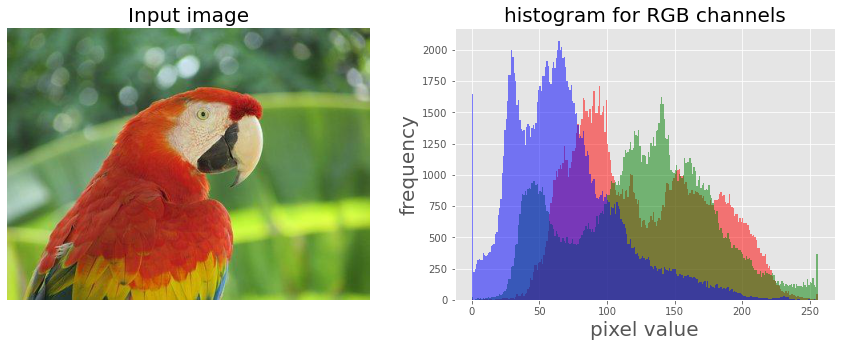

In [2]:
def plot_image(image, title=''):
    pylab.title(title, size=20), pylab.imshow(image,norm=None)
    pylab.axis('off') # comment this line if you want axis ticks
    
def plot_hist(r, g, b, title=''):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)
    pylab.hist(np.array(r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
    pylab.hist(np.array(g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
    pylab.hist(np.array(b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
    pylab.xlabel('pixel value', size=20), pylab.ylabel('frequency', size=20)
    pylab.title(title, size=20)
    
im = Image.open("../images/parrot.png")
im_r, im_g, im_b = im.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im, 'Input image')
pylab.subplot(122), plot_hist(im_r, im_g, im_b,'histogram for RGB channels')
pylab.show()

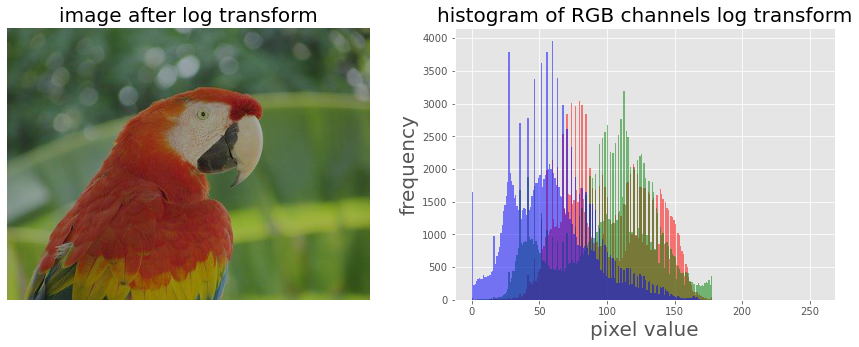

In [11]:
im = Image.open("../images/parrot.png")
im = im.point(lambda i: 255*np.log(1+i/255))
im_r, im_g, im_b = im.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im, 'image after log transform')
pylab.subplot(122), plot_hist(im_r, im_g, im_b, 'histogram of RGB channels log transform')
pylab.show()

### Power-law transform

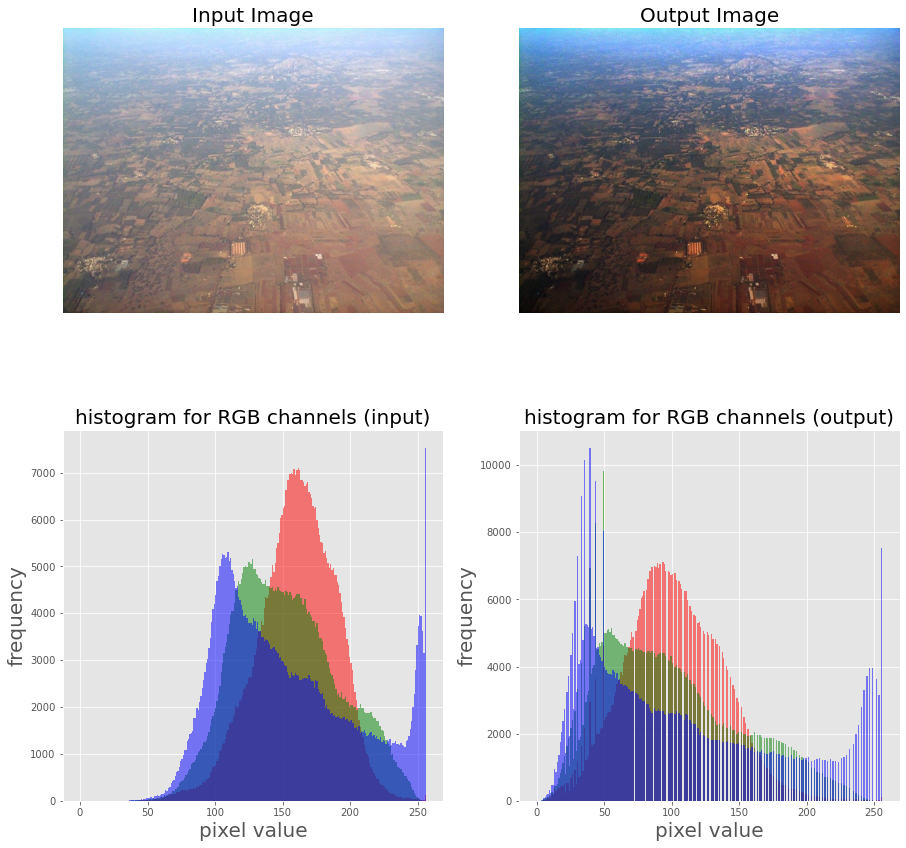

In [12]:
im = img_as_float(imread('../images/earthfromsky.jpg'))
gamma = 2.2
im1 = im**gamma
pylab.style.use('ggplot')
pylab.figure(figsize=(15,15))
pylab.subplot(221), plot_image(im, 'Input Image')
pylab.subplot(222), plot_image(im1, 'Output Image')
pylab.subplot(223), plot_hist(im[...,0], im[...,1], im[...,2], 'histogram for RGB channels (input)')
pylab.subplot(224), plot_hist(im1[...,0], im1[...,1], im1[...,2], 'histogram for RGB channels (output)')
pylab.show()

### Contrast stretching with PIL as a point operation

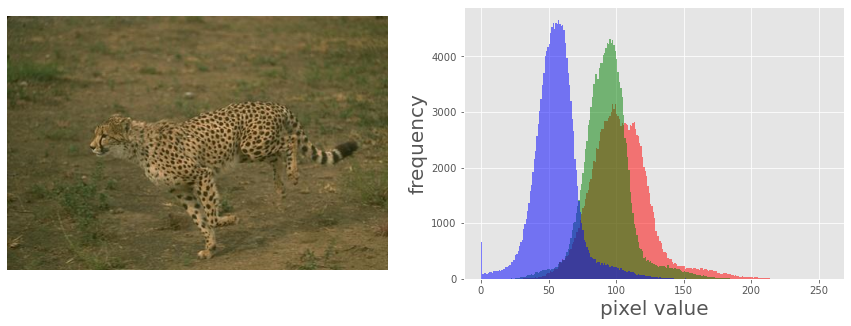

In [13]:
im = Image.open('../images/cheetah.png')
im_r, im_g, im_b, _ = im.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.show()

C:\Users\0109491s\AppData\Local\Temp/ipykernel_11388/3165361899.py:13: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  pylab.yscale('log',basey=10)


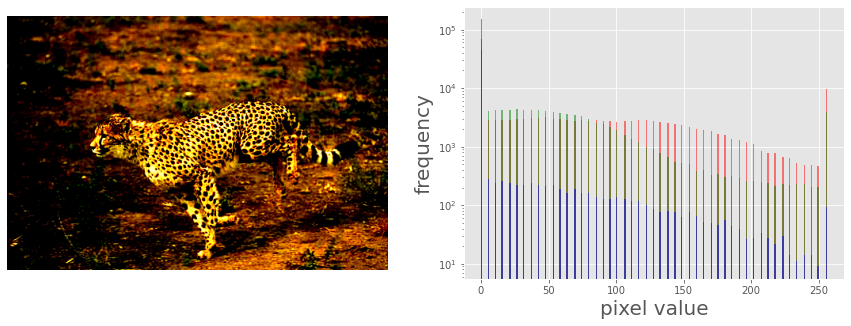

In [39]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48) # piece-wise linear function

im = Image.open('../images/cheetah.png')
im1 = im.point(contrast)
im_r, im_g, im_b, _ = im1.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im1)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.yscale('log',basey=10)
pylab.show()

### Contrast stretching Using the PIL ImageEnhance module

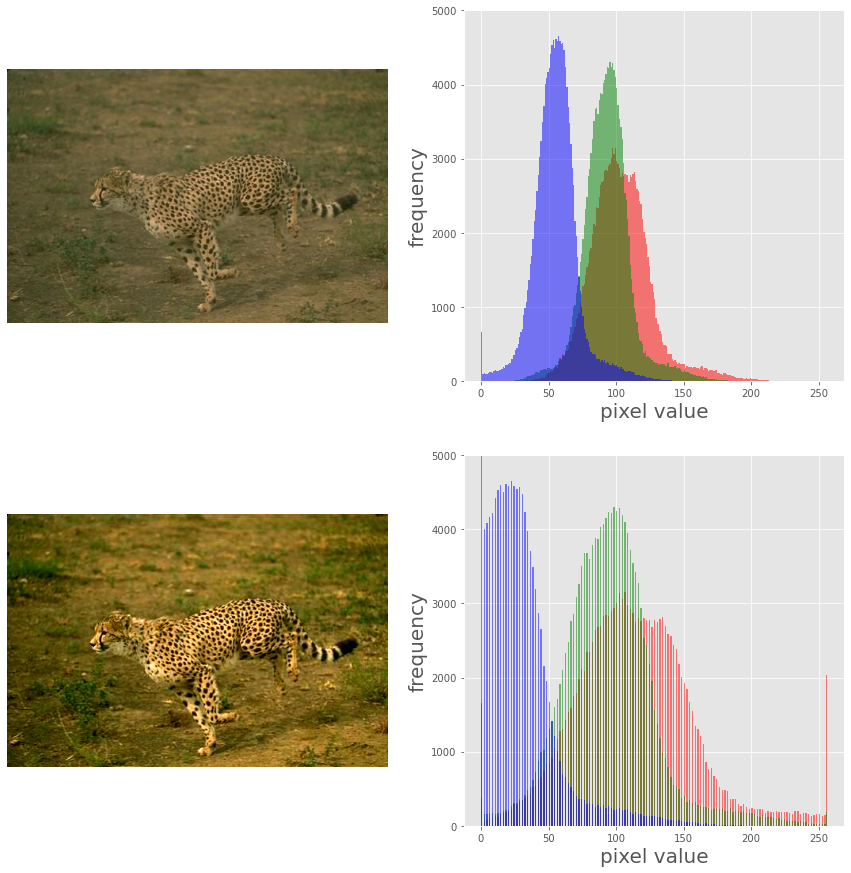

In [14]:
im = Image.open('../images/cheetah.png')
im_r, im_g, im_b, _ = im.split()
contrast = ImageEnhance.Contrast(im)
im1 = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8), (im.height, im.width, 4)) 
pylab.style.use('ggplot')
pylab.figure(figsize=(15,15))
pylab.subplot(221), plot_image(im)
pylab.subplot(222), plot_hist(im_r, im_g, im_b), pylab.ylim((0,5000))
pylab.subplot(223), plot_image(im1)
pylab.subplot(224), plot_hist(im1[...,0], im1[...,1], im1[...,2]), pylab.ylim((0,5000))
pylab.show()

### Thresholding With a fixed threshold

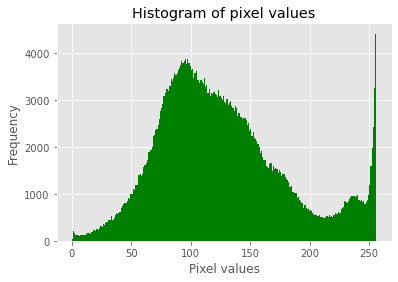

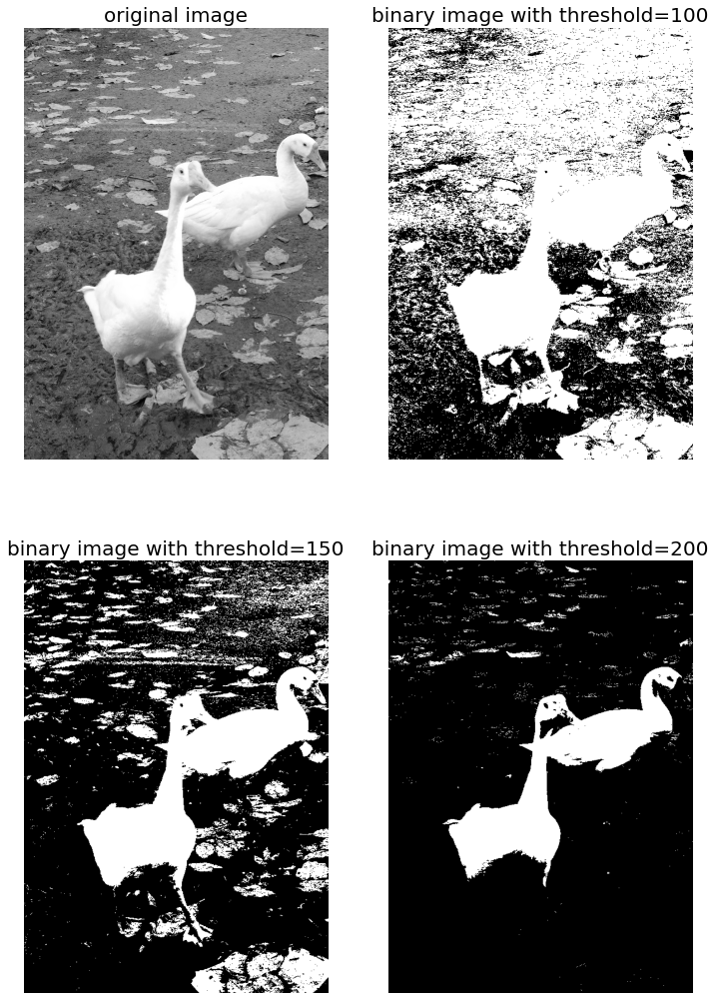

In [34]:
im = Image.open('../images/swans.jpg').convert('L')
pylab.hist(np.array(im).ravel(), bins=256, range=(0, 256), color='g')
pylab.xlabel('Pixel values'), pylab.ylabel('Frequency'),
pylab.title('Histogram of pixel values')
pylab.show()
pylab.figure(figsize=(12,18))
pylab.gray()
pylab.subplot(221), plot_image(im, 'original image'), pylab.axis('off')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    pylab.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' + str(th[i]))
pylab.show()

### Half-toning

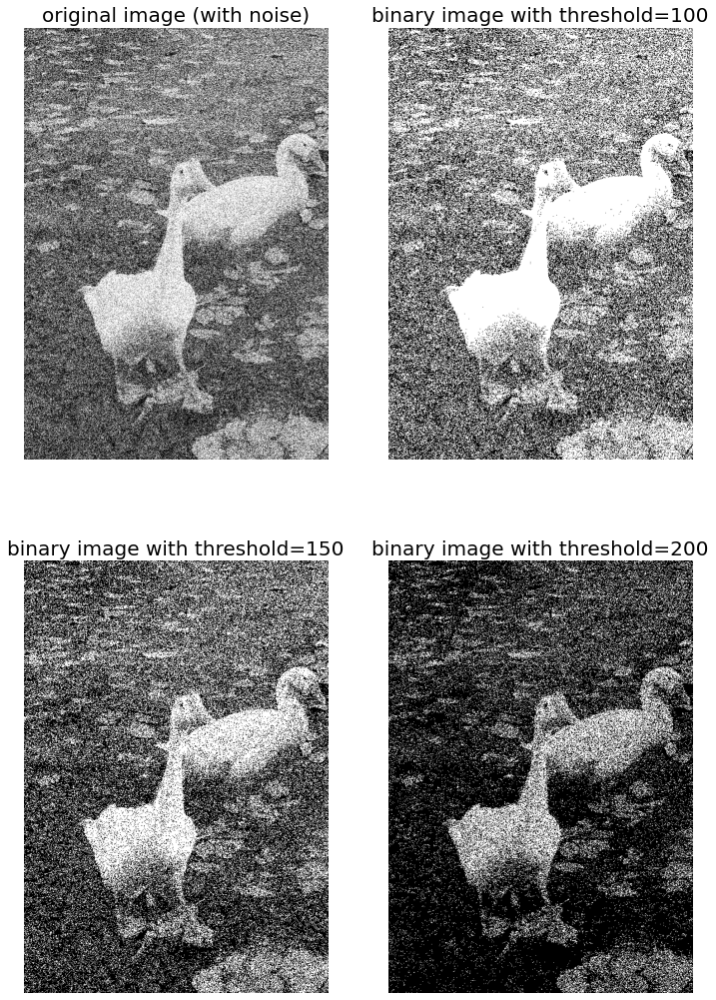

In [35]:
im = Image.open('../images/swans.jpg').convert('L')
im = Image.fromarray(np.clip(im + np.random.randint(-128, 128, (im.height, im.width)), 0, 255).astype(np.uint8))
pylab.figure(figsize=(12,18))
pylab.subplot(221), plot_image(im, 'original image (with noise)')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    pylab.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' +   str(th[i]))
pylab.show()

### Contrast stretching and histogram equalization with scikit-image

<Figure size 432x288 with 0 Axes>

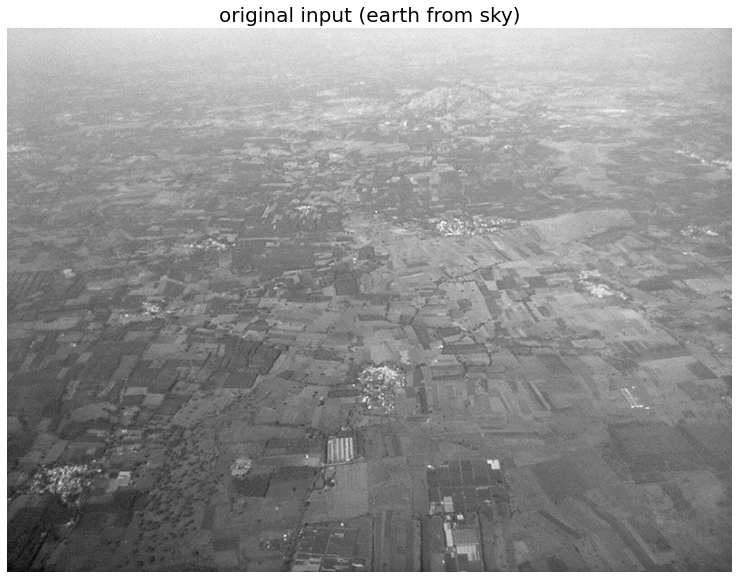

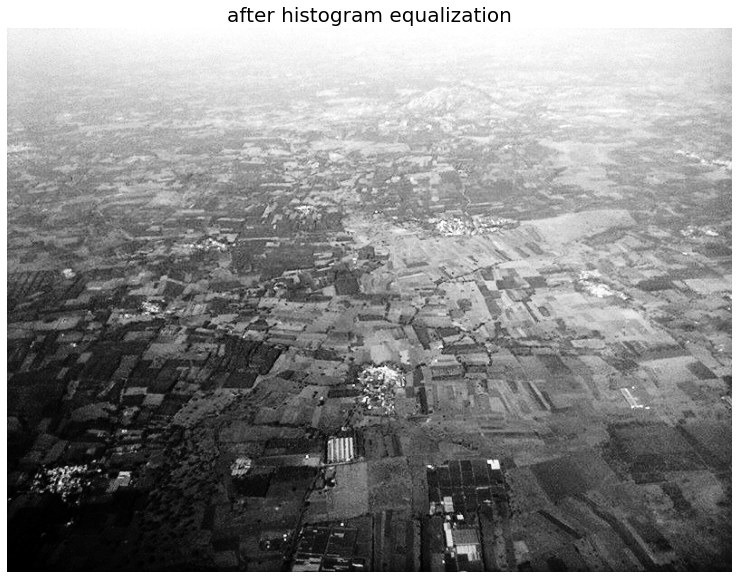

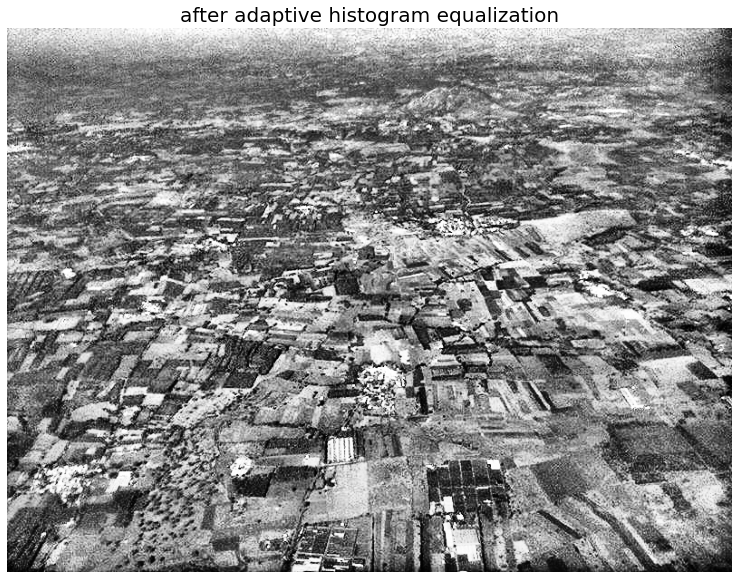

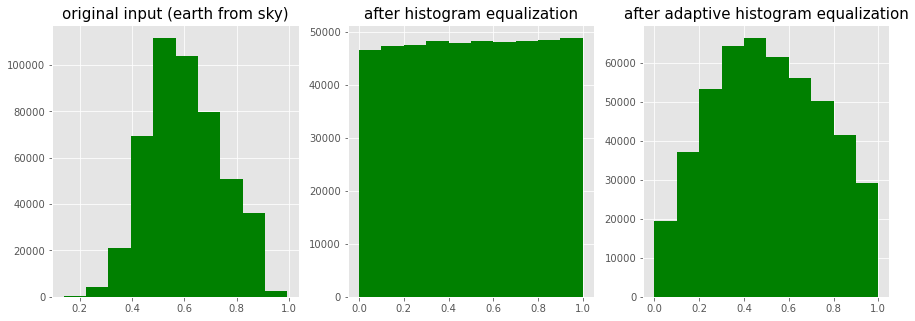

In [52]:
img = rgb2gray(imread('../images/earthfromsky.jpg'))
# histogram equalization
img_eq = exposure.equalize_hist(img)
# adaptive histogram equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
pylab.gray()
images = [img, img_eq, img_adapteq]
titles = ['original input (earth from sky)', 'after histogram equalization', 'after adaptive histogram equalization']
for i in range(3):
    pylab.figure(figsize=(20,10)), plot_image(images[i], titles[i])
pylab.figure(figsize=(15,5))
for i in range(3):
    pylab.subplot(1,3,i+1), pylab.hist(images[i].ravel(), color='g'), pylab.title(titles[i], size=15)
pylab.show()

13.0 255.0


C:\Users\0109491s\AppData\Local\Temp/ipykernel_11388/2242506429.py:31: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  axes = np.zeros((2, 4), dtype = np.object)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\ProgramData\Anaconda3\lib\site-packages\skimage\exposure\exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


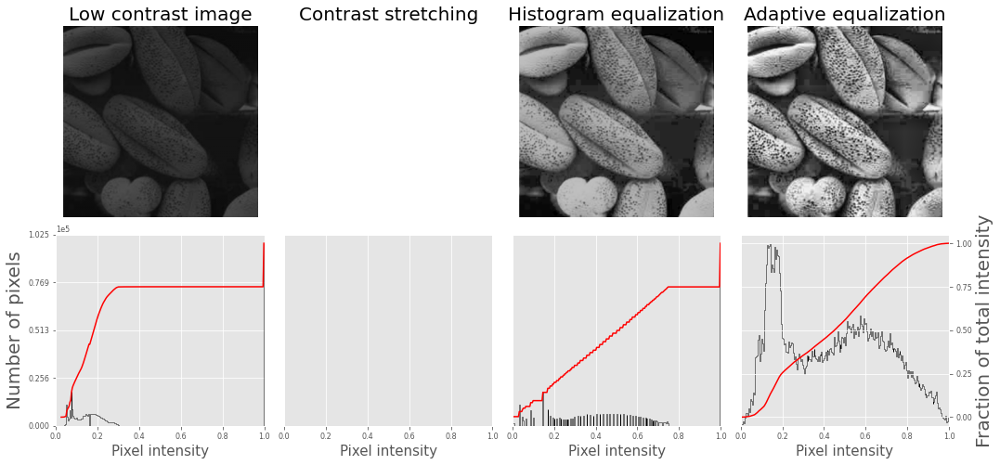

In [65]:
import matplotlib

matplotlib.rcParams['font.size'] = 8
def plot_image_and_hist(image, axes, bins=256):
    image = img_as_float(image)
    axes_image, axes_hist = axes
    axes_cdf = axes_hist.twinx()
    axes_image.imshow(image, cmap=pylab.cm.gray)
    axes_image.set_axis_off()
    axes_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    axes_hist.set_xlim(0, 1)
    axes_hist.set_xlabel('Pixel intensity', size=15)
    axes_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    axes_hist.set_yticks([])
    image_cdf, bins = exposure.cumulative_distribution(image, bins)
    axes_cdf.plot(bins, image_cdf, 'r')
    axes_cdf.set_yticks([])
    return axes_image, axes_hist, axes_cdf

im = io.imread('../images/beans_g.png')

# contrast stretching
p2, p98 = np.percentile(im,(2,98))
print(p2,p98)
im_rescale = exposure.rescale_intensity(im, in_range='image', out_range=(p2, p98))
im_eq = exposure.equalize_hist(im) # histogram equalization
im_adapteq = exposure.equalize_adapthist(im, clip_limit=0.03) # adaptive histogram equalization

fig = pylab.figure(figsize=(15, 7))
axes = np.zeros((2, 4), dtype = np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im, axes[:, 0])
axes_image.set_title('Low contrast image', size=20)
y_min, y_max = axes_hist.get_ylim()
axes_hist.set_ylabel('Number of pixels', size=20)
axes_hist.set_yticks(np.linspace(0, y_max, 5))
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_rescale, axes[:,1])
axes_image.set_title('Contrast stretching', size=20)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_eq, axes[:, 2])
axes_image.set_title('Histogram equalization', size=20)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_adapteq, axes[:,3])
axes_image.set_title('Adaptive equalization', size=20)
axes_cdf.set_ylabel('Fraction of total intensity', size=20)
axes_cdf.set_yticks(np.linspace(0, 1, 5))
fig.tight_layout()
pylab.show()

### Improving Image Contrast

C:\Users\0109491s\AppData\Local\Temp/ipykernel_1708/1510802052.py:15: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  hist, bins = np.histogram(img[...,i].flatten(),256,[0,256], normed=True)
C:\Users\0109491s\AppData\Local\Temp/ipykernel_1708/1510802052.py:15: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  hist, bins = np.histogram(img[...,i].flatten(),256,[0,256], normed=True)
C:\Users\01094

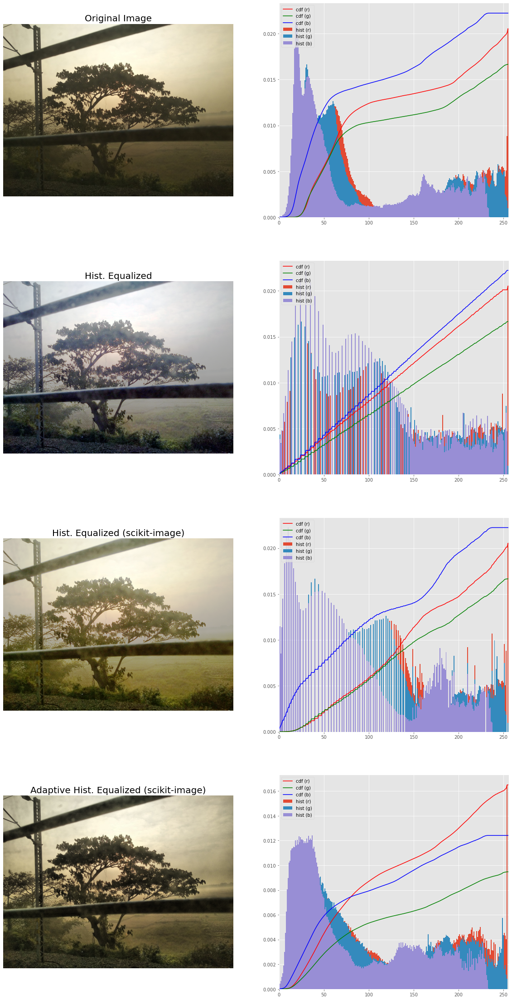

In [23]:
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread
from skimage.exposure import equalize_hist, equalize_adapthist

def plot_image(image, title):
    plt.imshow(image)
    plt.title(title, size=20)
    plt.axis('off')
    
def plot_hist(img):
    colors = ['r', 'g', 'b']
    cdf = np.zeros((256,3))
    for i in range(3):
        hist, bins = np.histogram(img[...,i].flatten(),256,[0,256], normed=True)
        cdf[...,i] = hist.cumsum()
        cdf_normalized = cdf[...,i] * hist.max() / cdf.max()
        plt.plot(cdf_normalized, color = colors[i], label='cdf ({})'.format(colors[i]))
        #plt.hist(img[...,i].flatten(),256,[0,256], color = colors[i], density=True)
        binWidth = bins[1] - bins[0]
        plt.bar(bins[:-1], hist*binWidth, binWidth, label='hist ({})'.format(colors[i]))
        plt.xlim([0,256])
    plt.legend(loc = 'upper left')
    return cdf

img = imread('../images/train.png')
#print(np.max(img))

plt.figure(figsize=(20,40))
#plt.gray()

plt.subplot(421), plot_image(img, 'Original Image')
plt.subplot(422) 
cdf = plot_hist(img)

img2 = np.copy(img)
for i in range(3):
    cdf_m = np.ma.masked_equal(cdf[...,i],0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    #cdf_m = 255 * cdf / cdf[-1] # normalize
    cdf2 = np.ma.filled(cdf_m,0).astype('uint8')
    img2[...,i] = cdf2[img[...,i]]

plt.subplot(423), plot_image(img2, 'Hist. Equalized')
plt.subplot(424), plot_hist(img2)

equ = (255*equalize_hist(img)).astype(np.uint8)
plt.subplot(425), plot_image(equ, 'Hist. Equalized (scikit-image)')
plt.subplot(426), plot_hist(equ)


equ = (255*equalize_adapthist(img)).astype(np.uint8)
plt.subplot(427), plot_image(equ, 'Adaptive Hist. Equalized (scikit-image)')
plt.subplot(428), plot_hist(equ)

plt.savefig('../images/hist_out.png', bbox_in='tight', pad_in=0)

plt.show()

### Histogram Matching

C:\Users\0109491s\AppData\Local\Temp/ipykernel_1708/42895541.py:26: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  im = (rgb2gray(imread('../images/beans_g.png'))*255).astype(np.uint8)


<Figure size 432x288 with 0 Axes>

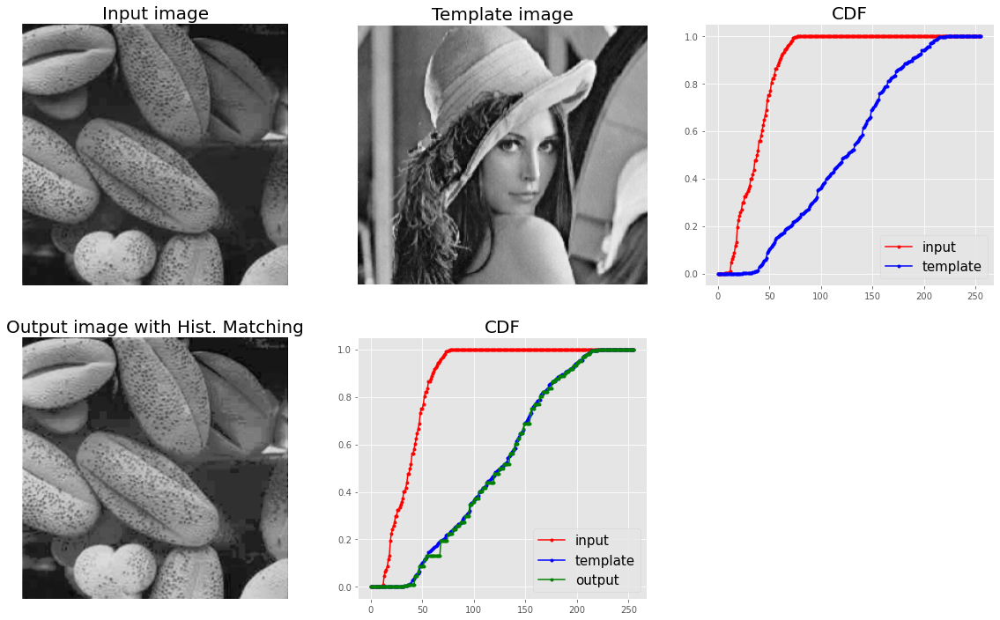

In [15]:
def cdf(im):
    '''
    computes the CDF of an image im as 2D numpy ndarray
    '''
    c, b = cumulative_distribution(im)
    # pad the beginning and ending pixels and their CDF values
    c = np.insert(c, 0, [0]*b[0])
    c = np.append(c, [1]*(255-b[-1]))
    return c

def hist_matching(c, c_t, im):
    '''
    c: CDF of input image computed with the function cdf()
    c_t: CDF of template image computed with the function cdf()
    im: input image as 2D numpy ndarray
    returns the modified pixel values for the input image
    '''
    pixels = np.arange(256)
    # find closest pixel-matches corresponding to the CDF of the input image, given the value of the CDF H of
    # the template image at the corresponding pixels, s.t. c_t = H(pixels) <=> pixels = H-1(c_t)
    new_pixels = np.interp(c, c_t, pixels)
    im = (np.reshape(new_pixels[im.ravel()], im.shape)).astype(np.uint8)
    return im

pylab.gray()
im = (rgb2gray(imread('../images/beans_g.png'))*255).astype(np.uint8)
im_t = (rgb2gray(imread('../images/lena_g.png'))*255).astype(np.uint8)


pylab.figure(figsize=(20,12))
pylab.subplot(2,3,1), plot_image(im, 'Input image')
pylab.subplot(2,3,2), plot_image(im_t, 'Template image')
c = cdf(im)
c_t = cdf(im_t)
pylab.subplot(2,3,3)
p = np.arange(256)
pylab.plot(p, c, 'r.-', label='input')
pylab.plot(p, c_t, 'b.-', label='template')
pylab.legend(prop={'size': 15})
pylab.title('CDF', size=20)
im = hist_matching(c, c_t, im)
pylab.subplot(2,3,4), plot_image(im, 'Output image with Hist. Matching')
c1 = cdf(im)
pylab.subplot(2,3,5)
pylab.plot(np.arange(256), c, 'r.-', label='input')
pylab.plot(np.arange(256), c_t, 'b.-', label='template')
pylab.plot(np.arange(256), c1, 'g.-', label='output')
pylab.legend(prop={'size': 15})
pylab.title('CDF', size=20)
pylab.show()

### Histogram Matching

255 255


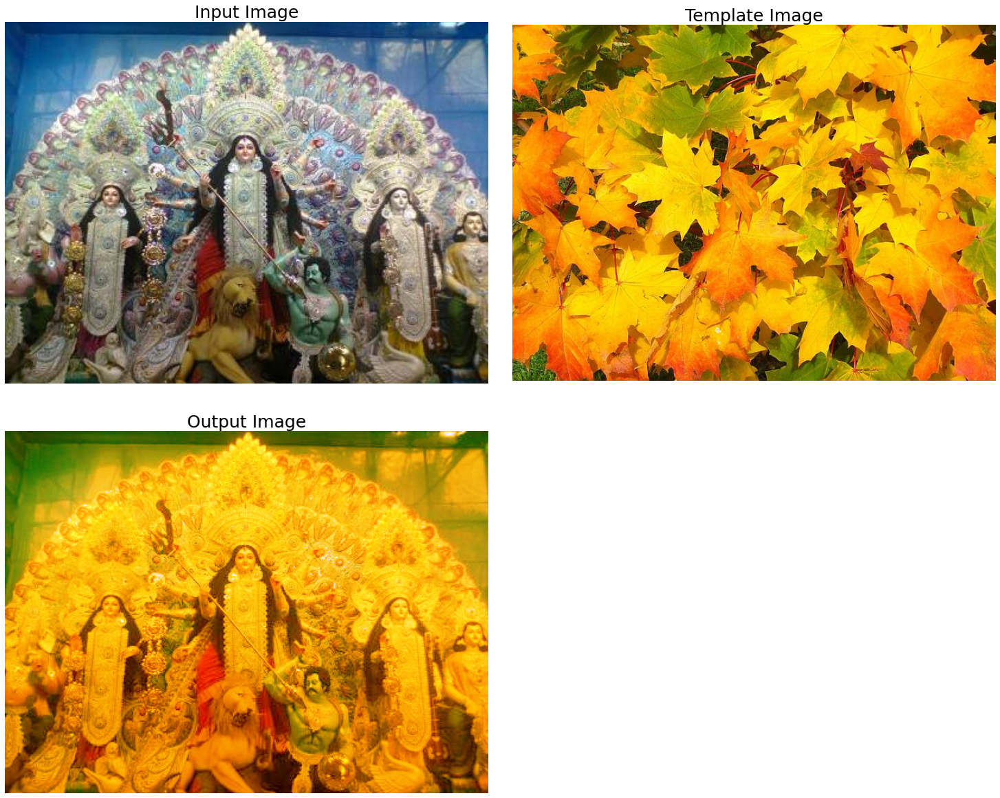

In [18]:
%matplotlib inline
from skimage.exposure import cumulative_distribution
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as plt
import numpy as np

def hist_matching(c, c_t, im):
    b = np.interp(c, c_t, np.arange(256))   # find closest matches to b_t
    pix_repl = {i:b[i] for i in range(256)} # dictionary to replace the pixels
    mp = np.arange(0,256)
    for (k, v) in pix_repl.items():
        mp[k] = v
    s = im.shape
    im = np.reshape(mp[im.ravel()], im.shape)
    im = np.reshape(im, s)
    return im

def cdf(im):
    c, b = cumulative_distribution(im)
    #print(b)
    for i in range(b[0]):
        c = np.insert(c, 0, 0)
    for i in range(b[-1]+1, 256):
        c = np.append(c, 1)
    return c

im = imread('../images/goddess.png').astype(np.uint8)
im_t = imread('../images/leaves.png')
print(np.max(im), np.max(im_t))

im1 = np.zeros(im.shape).astype(np.uint8)
for i in range(3):
    c = cdf(im[...,i])
    c_t = cdf(im_t[...,i])
    im1[...,i] = hist_matching(c, c_t, im[...,i])

plt.figure(figsize=(20,17))
plt.subplots_adjust(left=0, top=0.95, right=1, bottom=0, wspace=0.05, hspace=0.05)
plt.subplot(221), plt.imshow(im), plt.axis('off'), plt.title('Input Image', size=25)
plt.subplot(222), plt.imshow(im_t), plt.axis('off'), plt.title('Template Image', size=25)
plt.subplot(223), plt.imshow(im1[...,:3]), plt.axis('off'), plt.title('Output Image', size=25)
plt.show()

247 255


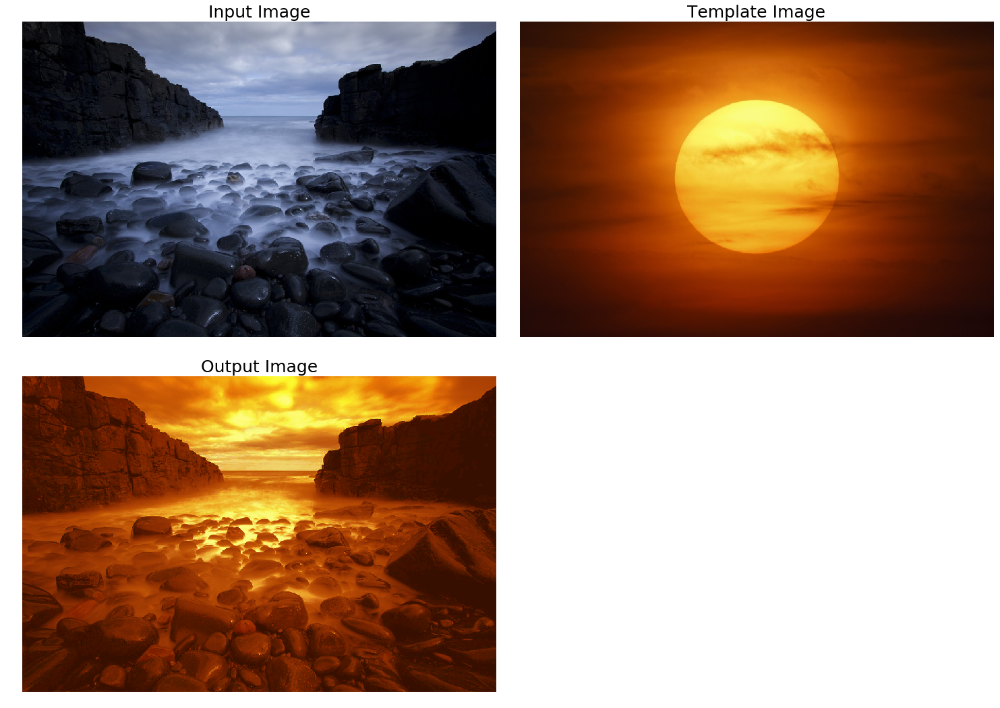

In [3]:
im = imread('images/rocks.png').astype(np.uint8)
im_t = imread('images/sun.png')
print(np.max(im), np.max(im_t))

im1 = np.zeros(im.shape).astype(np.uint8)
for i in range(3):
    c = cdf(im[...,i])
    c_t = cdf(im_t[...,i])
    im1[...,i] = hist_matching(c, c_t, im[...,i])

plt.figure(figsize=(20,15))
plt.subplots_adjust(left=0, top=0.95, right=1, bottom=0, wspace=0.05, hspace=0.05)
plt.subplot(221), plt.imshow(im), plt.axis('off'), plt.title('Input Image', size=25)
plt.subplot(222), plt.imshow(im_t), plt.axis('off'), plt.title('Template Image', size=25)
plt.subplot(223), plt.imshow(im1[...,:3]), plt.axis('off'), plt.title('Output Image', size=25)
plt.show()